# CNN-generated images are surprisingly easy to spot... for now

## 1. Setup

In [95]:
# Setup

import os
import sys
import torch
import torch.nn
import torch.nn as nn
import argparse
import numpy as np
import torchvision.transforms as transforms
import torchvision.datasets as datasets
import torch.utils.model_zoo as model_zoo
from PIL import Image
import csv
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import cv2
import torch.utils.data
from sklearn.metrics import average_precision_score, precision_recall_curve, accuracy_score
import tqdm.notebook as tq
import random

from google.colab import drive

# Note: you need the test dataset ready in your own google drive
drive.mount('/content/drive')
!ls "/content/drive/My Drive/598dataset"

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
biggan	blur_jpg_prob0.1.pth  crn  deepfake  stargan  stylegan	stylegan2


In [2]:
# load the classifier
model_urls = {
    'resnet18': 'https://download.pytorch.org/models/resnet18-5c106cde.pth',
    'resnet34': 'https://download.pytorch.org/models/resnet34-333f7ec4.pth',
    'resnet50': 'https://download.pytorch.org/models/resnet50-19c8e357.pth',
    'resnet101': 'https://download.pytorch.org/models/resnet101-5d3b4d8f.pth',
    'resnet152': 'https://download.pytorch.org/models/resnet152-b121ed2d.pth',
}

def conv3x3(in_planes, out_planes, stride=1):
    """3x3 convolution with padding"""
    return nn.Conv2d(in_planes, out_planes, kernel_size=3, stride=stride,
                     padding=1, bias=False)


def conv1x1(in_planes, out_planes, stride=1):
    """1x1 convolution"""
    return nn.Conv2d(in_planes, out_planes, kernel_size=1, stride=stride, bias=False)


class BasicBlock(nn.Module):
    expansion = 1

    def __init__(self, inplanes, planes, stride=1, downsample=None):
        super(BasicBlock, self).__init__()
        self.conv1 = conv3x3(inplanes, planes, stride)
        self.bn1 = nn.BatchNorm2d(planes)
        self.relu = nn.ReLU(inplace=True)
        self.conv2 = conv3x3(planes, planes)
        self.bn2 = nn.BatchNorm2d(planes)
        self.downsample = downsample
        self.stride = stride

    def forward(self, x):
        identity = x

        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)

        out = self.conv2(out)
        out = self.bn2(out)

        if self.downsample is not None:
            identity = self.downsample(x)

        out += identity
        out = self.relu(out)

        return out


class Bottleneck(nn.Module):
    expansion = 4

    def __init__(self, inplanes, planes, stride=1, downsample=None):
        super(Bottleneck, self).__init__()
        self.conv1 = conv1x1(inplanes, planes)
        self.bn1 = nn.BatchNorm2d(planes)
        self.conv2 = conv3x3(planes, planes, stride)
        self.bn2 = nn.BatchNorm2d(planes)
        self.conv3 = conv1x1(planes, planes * self.expansion)
        self.bn3 = nn.BatchNorm2d(planes * self.expansion)
        self.relu = nn.ReLU(inplace=True)
        self.downsample = downsample
        self.stride = stride

    def forward(self, x):
        identity = x

        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)

        out = self.conv2(out)
        out = self.bn2(out)
        out = self.relu(out)

        out = self.conv3(out)
        out = self.bn3(out)

        if self.downsample is not None:
            identity = self.downsample(x)

        out += identity
        out = self.relu(out)

        return out


class ResNet(nn.Module):

    def __init__(self, block, layers, num_classes=1000, zero_init_residual=False):
        super(ResNet, self).__init__()
        self.inplanes = 64
        self.conv1 = nn.Conv2d(3, 64, kernel_size=7, stride=2, padding=3,
                               bias=False)
        self.bn1 = nn.BatchNorm2d(64)
        self.relu = nn.ReLU(inplace=True)
        self.maxpool = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)
        self.layer1 = self._make_layer(block, 64, layers[0])
        self.layer2 = self._make_layer(block, 128, layers[1], stride=2)
        self.layer3 = self._make_layer(block, 256, layers[2], stride=2)
        self.layer4 = self._make_layer(block, 512, layers[3], stride=2)
        self.avgpool = nn.AdaptiveAvgPool2d((1, 1))
        self.fc = nn.Linear(512 * block.expansion, num_classes)

        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
            elif isinstance(m, nn.BatchNorm2d):
                nn.init.constant_(m.weight, 1)
                nn.init.constant_(m.bias, 0)

        # Zero-initialize the last BN in each residual branch,
        # so that the residual branch starts with zeros, and each residual block behaves like an identity.
        # This improves the model by 0.2~0.3% according to https://arxiv.org/abs/1706.02677
        if zero_init_residual:
            for m in self.modules():
                if isinstance(m, Bottleneck):
                    nn.init.constant_(m.bn3.weight, 0)
                elif isinstance(m, BasicBlock):
                    nn.init.constant_(m.bn2.weight, 0)

    def _make_layer(self, block, planes, blocks, stride=1):
        downsample = None
        if stride != 1 or self.inplanes != planes * block.expansion:
            downsample = nn.Sequential(
                conv1x1(self.inplanes, planes * block.expansion, stride),
                nn.BatchNorm2d(planes * block.expansion),
            )

        layers = []
        layers.append(block(self.inplanes, planes, stride, downsample))
        self.inplanes = planes * block.expansion
        for _ in range(1, blocks):
            layers.append(block(self.inplanes, planes))

        return nn.Sequential(*layers)

    def forward(self, x):
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.maxpool(x)

        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)

        x = self.avgpool(x)
        x = x.view(x.size(0), -1)
        x = self.fc(x)

        return x

def resnet50(pretrained=False, **kwargs):
    """Constructs a ResNet-50 model.
    Args:
        pretrained (bool): If True, returns a model pre-trained on ImageNet
    """
    model = ResNet(Bottleneck, [3, 4, 6, 3], **kwargs)
    if pretrained:
        model.load_state_dict(model_zoo.load_url(model_urls['resnet50']))
    return model


In [ ]:
# We use ResNet50, same as the original paper
model = resnet50(num_classes=1)

# download the weights
! wget https://www.dropbox.com/s/h7tkpcgiwuftb6g/blur_jpg_prob0.1.pth?dl=0 -O ./drive/MyDrive/598dataset/blur_jpg_prob0.1.pth
model_path = r'./drive/MyDrive/598dataset/blur_jpg_prob0.1.pth'

# Load the weight
state_dict = torch.load(model_path, map_location='cpu')
model.load_state_dict(state_dict['model'])
model.eval()

In [4]:
# Transform (crop and normalize)
trans = transforms.Compose([
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])


## 2. Quantitative Evaluation

In [5]:
# config
batch_size = 32
workers = 16
crop = 224
use_cpu = True
size_only = False


def quantitative_eval(model, dir):

  # Dataset loader
  if(type(dir)==str):
    dir = [dir,]

  # dataloader
  print('Loading [%i] datasets'%len(dir))
  data_loaders = []
  for dir in dir:
    dataset = datasets.ImageFolder(dir, transform=trans)
    data_loaders+=[torch.utils.data.DataLoader(dataset,
                                            batch_size=batch_size,
                                            shuffle=False,
                                            num_workers=workers),]
  # Eval
  y_true, y_pred = [], []
  Hs, Ws = [], []
  with torch.no_grad():
    for data_loader in data_loaders:
      for data, label in tq.tqdm(data_loader):
      # for data, label in data_loader:
        Hs.append(data.shape[2])
        Ws.append(data.shape[3])

        y_true.extend(label.flatten().tolist())
        if(not size_only):
          if(not use_cpu):
              data = data.cuda()
          y_pred.extend(model(data).sigmoid().flatten().tolist())

  Hs, Ws = np.array(Hs), np.array(Ws)
  y_true, y_pred = np.array(y_true), np.array(y_pred)

  print('Average sizes: [{:2.2f}+/-{:2.2f}] x [{:2.2f}+/-{:2.2f}] = [{:2.2f}+/-{:2.2f} Mpix]'.format(np.mean(Hs), np.std(Hs), np.mean(Ws), np.std(Ws), np.mean(Hs*Ws)/1e6, np.std(Hs*Ws)/1e6))
  print('Num reals: {}, Num fakes: {}'.format(np.sum(1-y_true), np.sum(y_true)))

  if(not size_only):
    r_acc = accuracy_score(y_true[y_true==0], y_pred[y_true==0] > 0.5)
    f_acc = accuracy_score(y_true[y_true==1], y_pred[y_true==1] > 0.5)
    acc = accuracy_score(y_true, y_pred > 0.5)
    ap = average_precision_score(y_true, y_pred)

    print('AP: {:2.2f}, Acc: {:2.2f}, Acc (real): {:2.2f}, Acc (fake): {:2.2f}'.format(ap*100., acc*100., r_acc*100., f_acc*100.))
  

### 2.1 BigGAN

In [6]:
# biggan
dir = './drive/MyDrive/598dataset/biggan'
quantitative_eval(model, dir)

Loading [1] datasets


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 16 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))



Average sizes: [224.00+/-0.00] x [224.00+/-0.00] = [0.05+/-0.00 Mpix]
Num reals: 2000, Num fakes: 2000
AP: 84.51, Acc: 70.17, Acc (real): 93.45, Acc (fake): 46.90


### 2.2 CRN

In [7]:
# crn

dir = './drive/MyDrive/598dataset/crn'
quantitative_eval(model, dir)

Loading [1] datasets


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 16 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))



Average sizes: [224.00+/-0.00] x [224.00+/-0.00] = [0.05+/-0.00 Mpix]
Num reals: 6382, Num fakes: 6382
AP: 98.24, Acc: 86.29, Acc (real): 72.70, Acc (fake): 99.87


### 2.3 StarGAN

In [8]:
# stargan

dir = './drive/MyDrive/598dataset/stargan'
quantitative_eval(model, dir)

Loading [1] datasets


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 16 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))



Average sizes: [224.00+/-0.00] x [224.00+/-0.00] = [0.05+/-0.00 Mpix]
Num reals: 1999, Num fakes: 1999
AP: 98.15, Acc: 91.75, Acc (real): 96.75, Acc (fake): 86.74


### 2.4 StyleGAN2 (out-of-the-box test case) 

* Not in the ForenSynths dataset originally, but images directly output by CNN decoders


In [9]:
# stylegan2 
dir = ['./drive/MyDrive/598dataset/stylegan2/car', './drive/MyDrive/598dataset/stylegan2/cat', './drive/MyDrive/598dataset/stylegan2/church', './drive/MyDrive/598dataset/stylegan2/horse']

quantitative_eval(model, dir)

Loading [4] datasets


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 16 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))



Average sizes: [224.00+/-0.00] x [224.00+/-0.00] = [0.05+/-0.00 Mpix]
Num reals: 7988, Num fakes: 7988
AP: 99.10, Acc: 84.40, Acc (real): 99.96, Acc (fake): 68.84


### 2.5 DeepFake (Out-of-distribution test)

* Images generated not directly from CNN generators (poisson image blending is required)
* But this is in the ForenSynths dataset




In [10]:
dir = './drive/MyDrive/598dataset/deepfake'
quantitative_eval(model, dir)

Loading [1] datasets


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 16 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))



Average sizes: [224.00+/-0.00] x [224.00+/-0.00] = [0.05+/-0.00 Mpix]
Num reals: 2707, Num fakes: 2698
AP: 89.02, Acc: 53.49, Acc (real): 99.96, Acc (fake): 6.86


## 3. Fakeness score

In [11]:

def collect_predictions(model, fake_dir):

  # collect predictions
  container = []
  fake_filenames = os.listdir(fake_dir)
  counter = 0
  with torch.no_grad():
    for name in tq.tqdm(fake_filenames):
      if '.png' in name:
        img = trans(Image.open(os.path.join(fake_dir, name)).convert('RGB'))
        in_tens = img.unsqueeze(0)
        prob = model(in_tens).sigmoid().item()
        item = [os.path.join(fake_dir, name), prob]
        container.append(item)

  container = sorted(container, key=lambda x: x[1])

  return container



def fakeness_demo(container, name):


  figsize = (25, 10)

  fig=plt.figure()
  plt.gcf().set_size_inches(figsize[0], figsize[1])
  for i in range(1,9):
      ax=fig.add_subplot(2,4,i)      
      index = int(len(container) * 0) + i - 1
      image = plt.imread(container[index][0])
      ax.imshow(image)
      ax.axis('off')
  fig.suptitle('{} 0 percentile'.format(name)) # or plt.suptitle('Main title')
  plt.show()



  print('\n'*4)

  fig=plt.figure()
  plt.gcf().set_size_inches(figsize[0], figsize[1])
  for i in range(1,9):
      ax=fig.add_subplot(2,4,i)      
      index = int(len(container) * 0.25) + i - 1
      image = plt.imread(container[index][0])
      ax.imshow(image)
      ax.axis('off')

  fig.suptitle('{} 25 percentile'.format(name)) # or plt.suptitle('Main title')
  plt.show()


  print('\n'*4)

  fig=plt.figure()
  plt.gcf().set_size_inches(figsize[0], figsize[1])
  for i in range(1,9):
      ax=fig.add_subplot(2,4,i)      
      index = int(len(container) * 0.5) + i - 1
      image = plt.imread(container[index][0])
      ax.imshow(image)
      ax.axis('off')

  fig.suptitle('{} 50 percentile'.format(name)) # or plt.suptitle('Main title')
  plt.show()



  print('\n'*4)

  fig=plt.figure()
  plt.gcf().set_size_inches(figsize[0], figsize[1])
  for i in range(1,9):
      ax=fig.add_subplot(2,4,i)      
      index = int(len(container) * 0.75) + i - 1
      image = plt.imread(container[index][0])
      ax.imshow(image)
      ax.axis('off')

  fig.suptitle('{} 75 percentile'.format(name)) # or plt.suptitle('Main title')
  plt.show()


  print('\n'*4)

  fig=plt.figure()
  plt.gcf().set_size_inches(figsize[0], figsize[1])
  for i in range(1,9):
      ax=fig.add_subplot(2,4,i)      
      index = int(len(container) * 1) - 9 + i
      image = plt.imread(container[index][0])
      ax.imshow(image)
      ax.axis('off')

  fig.suptitle('{} 100 percentile'.format(name)) # or plt.suptitle('Main title')
  plt.show()


### 3.1 BigGAN

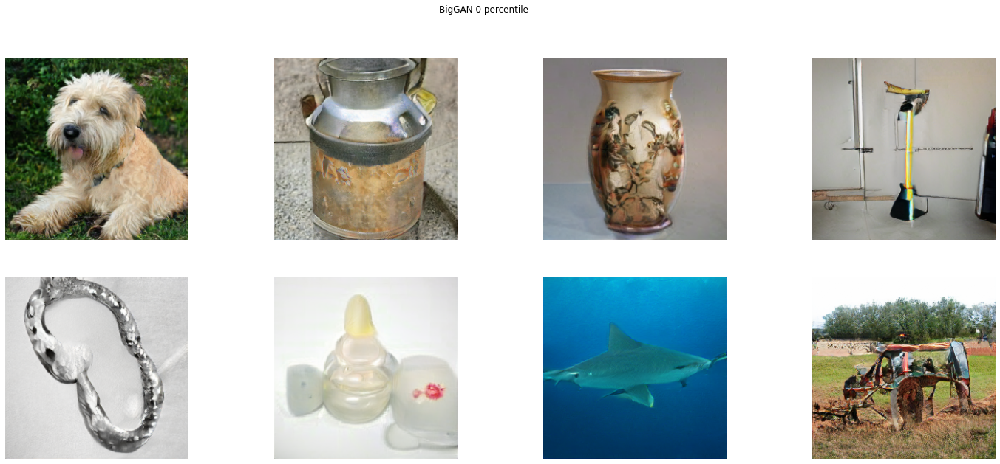

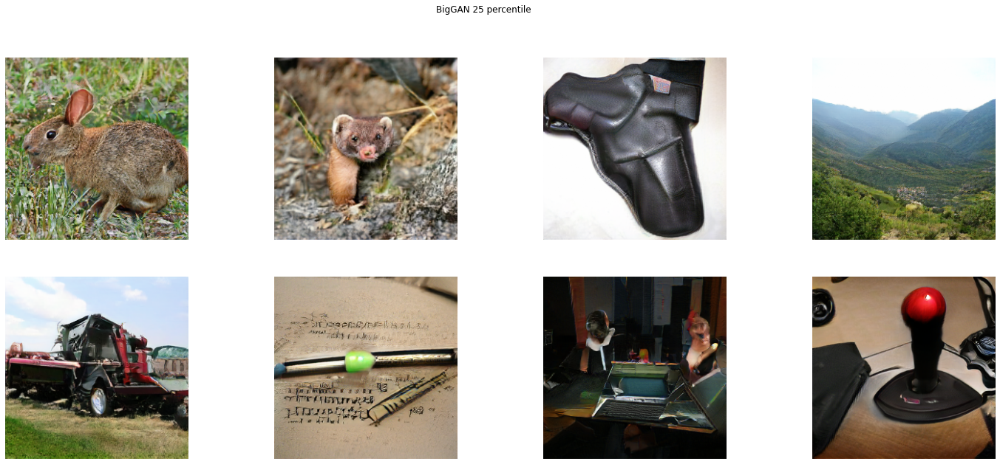

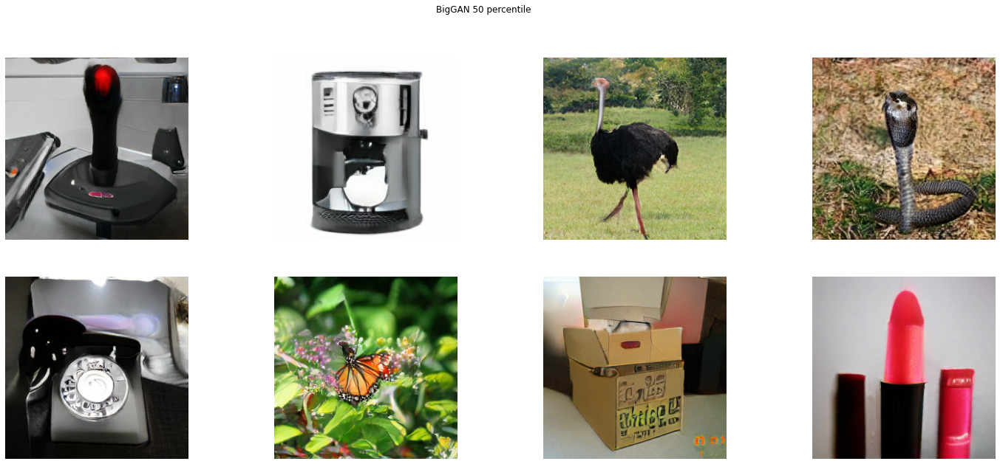

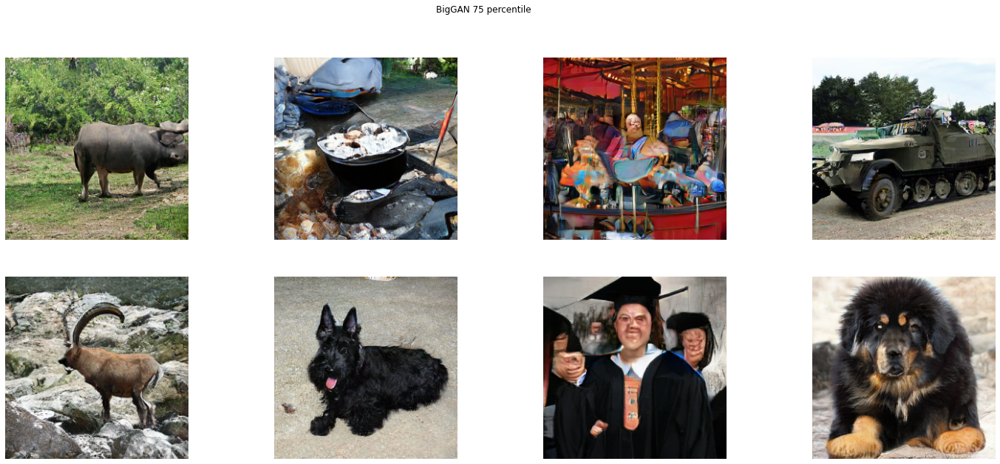

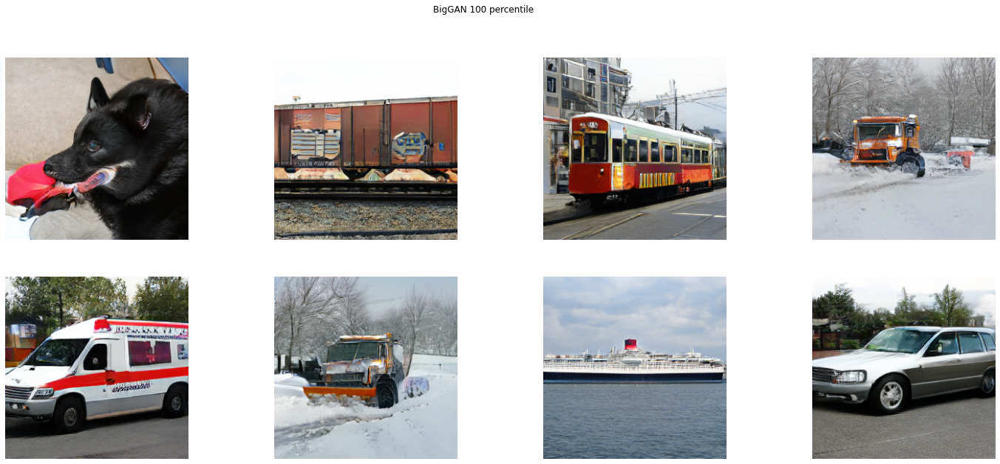

In [12]:
fake_dir = './drive/MyDrive/598dataset/biggan/1_fake'
biggan_container = collect_predictions(model, fake_dir)
fakeness_demo(biggan_container, 'BigGAN')

### 3.2 StarGAN

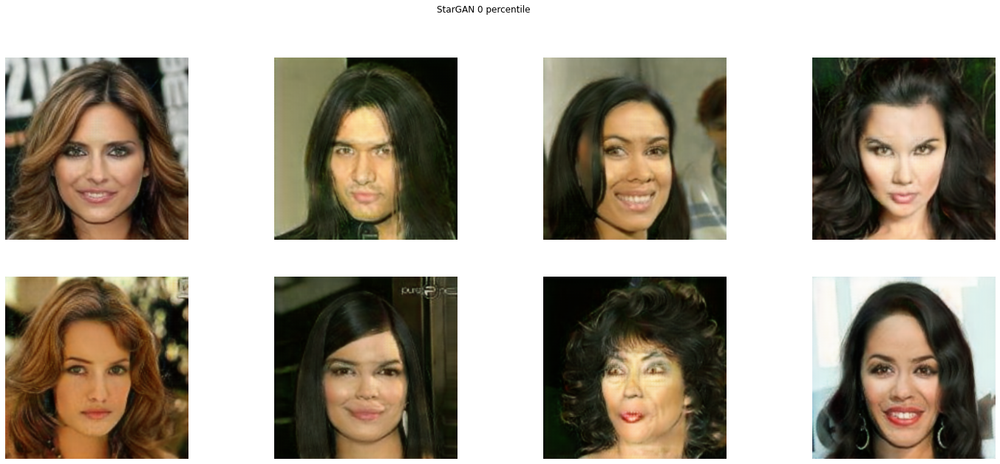

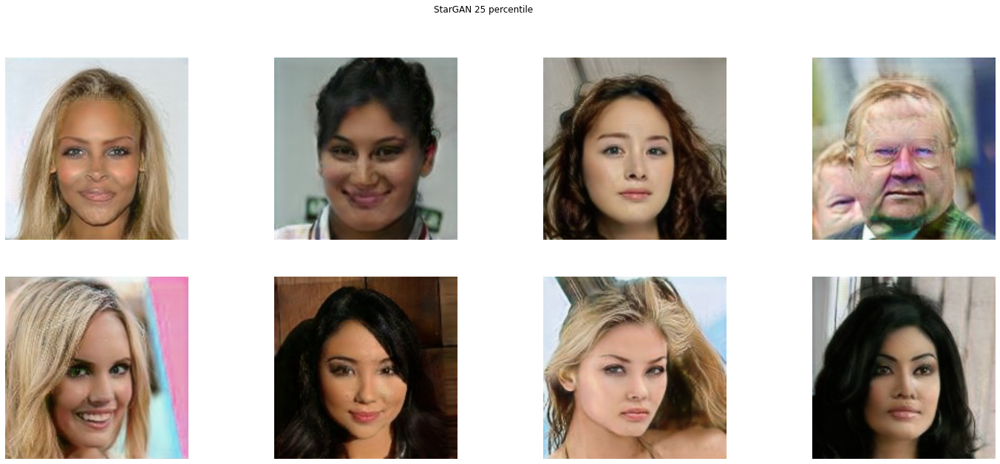

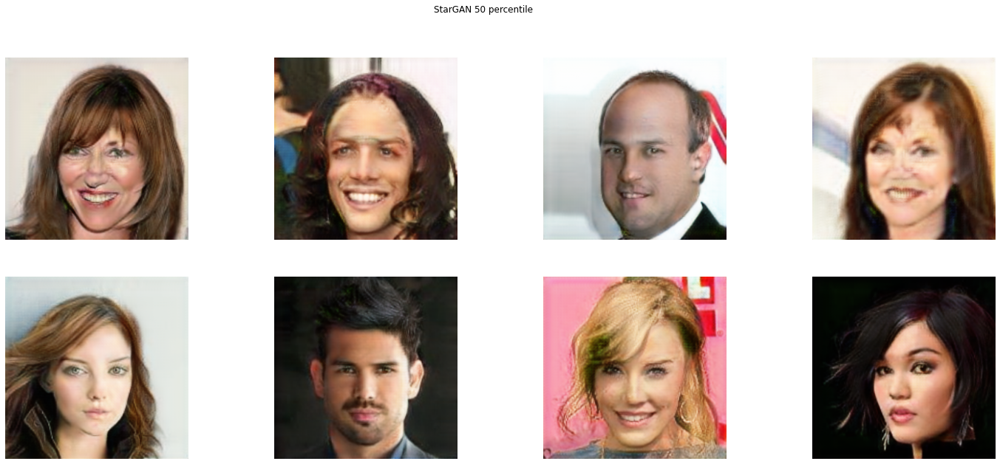

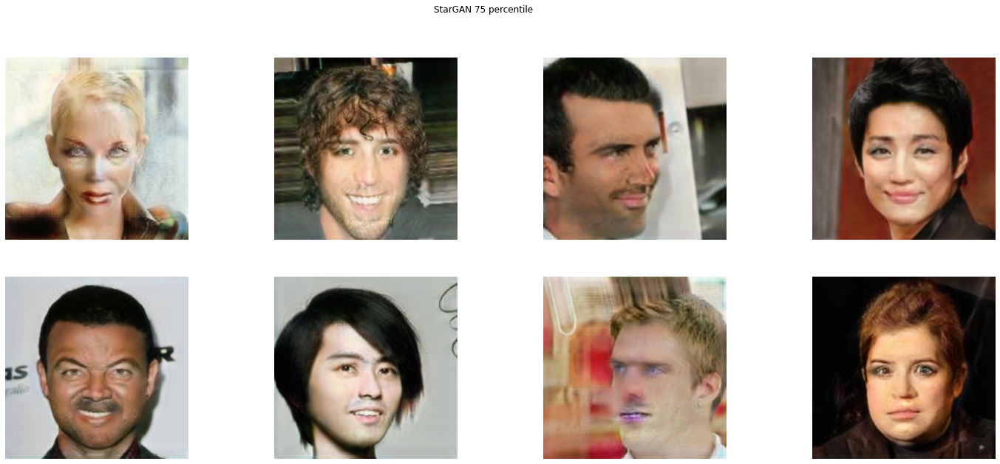

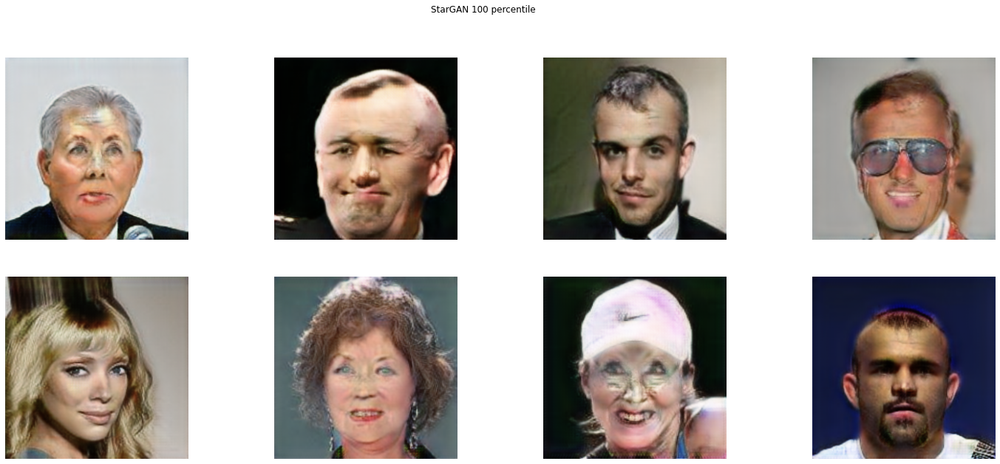

In [13]:
fake_dir = './drive/MyDrive/598dataset/stargan/1_fake'
stargan_container = collect_predictions(model, fake_dir)
fakeness_demo(stargan_container, 'StarGAN')

## 4. Frequency Analysis

In [96]:
# center crop 224 x 224 
def center_crop(img): 
  height, width = img.shape
  mid_w, mid_h = int(width/2), int(height/2)
  return img[mid_h-112:mid_h+112, mid_w-112:mid_w+112]


# read images from files 
def load_images(folder, sample_size=2000): 
  images = []
  idx = -1

  #shuffle
  filenames = os.listdir(folder)
  random.shuffle(filenames)

  for filename in tq.tqdm(filenames[:sample_size]): 
    
    idx += 1
    if idx == sample_size: 
      break 
    
    img = cv2.imread(os.path.join(folder, filename), 0)
    img = center_crop(img)
    if img is not None: 
      images.append(img)
  return images


def generate_spectra(img): 

  # substract median blur 
  img2 = img - cv2.medianBlur(img, 3)

  # Fourier Transform
  f = np.fft.fft2(img2)
  fshift = np.fft.fftshift(f)

  magnitude_spectrum = 20*np.log(np.abs(fshift))
  
  return magnitude_spectrum


def average_spectra(images): 

  spectra_sum = np.zeros_like(images[0])
  
  for img in tq.tqdm(images): 
    spectra = generate_spectra(img)
    spectra_sum = spectra_sum + spectra 
  return spectra_sum / len(images)

In [15]:
%cd /content/drive/My Drive
%pwd

/content/drive/My Drive


'/content/drive/My Drive'

### 4.1 CRN

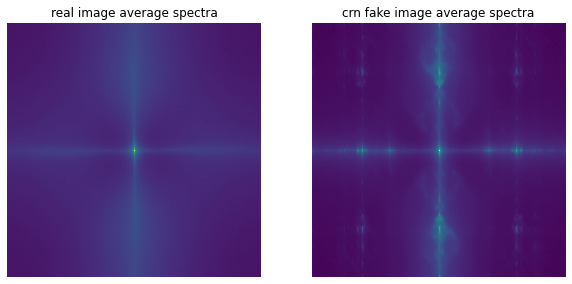

In [97]:
fake_images= load_images('598dataset/crn/1_fake')
real_images = load_images('598dataset/crn/0_real')

fig, ax = plt.subplots(1,2, figsize=(10, 10))
for a in ax:
  a.set_axis_off()
ax[0].set_title('real image average spectra')
ax[0].imshow(average_spectra(real_images))
ax[1].set_title('crn fake image average spectra')
ax[1].imshow(average_spectra(fake_images))

### 4.2 StarGAN

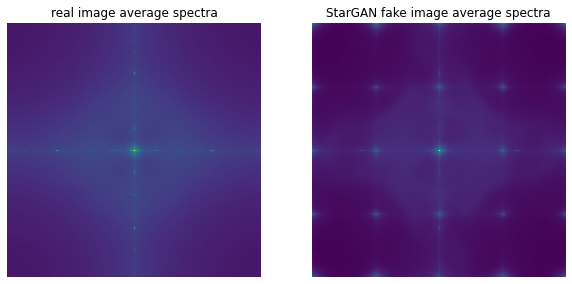

In [98]:
fake_images= load_images('598dataset/stargan/1_fake')
real_images = load_images('598dataset/stargan/0_real')

fig, ax = plt.subplots(1,2, figsize=(10, 10))
for a in ax:
  a.set_axis_off()
ax[0].set_title('real image average spectra')
ax[0].imshow(average_spectra(real_images))
ax[1].set_title('StarGAN fake image average spectra')
ax[1].imshow(average_spectra(fake_images))


### DeepFake


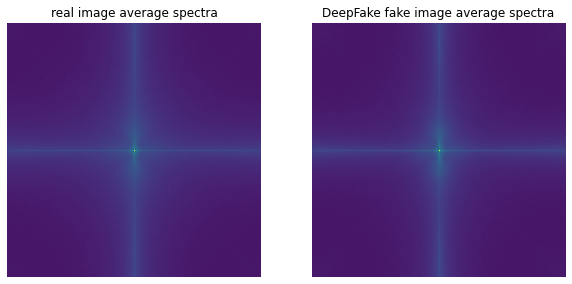

In [99]:
fake_images= load_images('598dataset/deepfake/1_fake')
real_images = load_images('598dataset/deepfake/0_real')

fig, ax = plt.subplots(1,2, figsize=(10, 10))
for a in ax:
  a.set_axis_off()
ax[0].set_title('real image average spectra')
ax[0].imshow(average_spectra(real_images))
ax[1].set_title('DeepFake fake image average spectra')
ax[1].imshow(average_spectra(fake_images))